In [1]:
!nvidia-smi -L

'nvidia-smi' is not recognized as an internal or external command,
operable program or batch file.


In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings

warnings.filterwarnings("ignore")
%matplotlib inline

In [3]:
df=pd.read_csv("/content/drive/MyDrive/papers.csv")
df.head()

FileNotFoundError: [Errno 2] No such file or directory: '/content/drive/MyDrive/papers.csv'

In [ ]:
df['body_text']=df['title']+df['pdf_name']+df['paper_text']

In [ ]:
df.drop(['id','year','event_type','abstract','title','pdf_name','paper_text'],axis=1, inplace=True)
df.head()

,body_text
0,Self-Organization of Associative Database and ...
1,A Mean Field Theory of Layer IV of Visual Cort...
2,Storing Covariance by the Associative Long-Ter...
3,Bayesian Query Construction for Neural Network...
4,"Neural Network Ensembles, Cross Validation, an..."


In [ ]:
#Fetch wordcount for each abstract
df['word_count'] = df['body_text'].apply(lambda x: len(str(x).split(" ")))
df[['body_text','word_count']].head()

,body_text,word_count
0,Self-Organization of Associative Database and ...,3321
1,A Mean Field Theory of Layer IV of Visual Cort...,2249
2,Storing Covariance by the Associative Long-Ter...,2741
3,Bayesian Query Construction for Neural Network...,2929
4,"Neural Network Ensembles, Cross Validation, an...",3016


In [ ]:
df.describe()

,word_count
count,7241.000000
mean,4265.871427
std,1237.636598
min,7.000000
25%,3218.000000
50%,4480.000000
75%,5201.000000
max,11526.000000


In [ ]:
#Identify most common words
freq = pd.Series(' '.join(df['body_text']).split()).value_counts()[:20]
freq

the     1742074
of       994278
and      739119
?        643829
a        585594
to       565931
is       496200
in       473232
for      352845
that     291218
=        282147
,        226448
we       226390
with     224729
The      208146
on       193863
.        190765
by       185167
are      182559
as       181199
dtype: int64

In [ ]:
#Identify uncommon words
freq1 =  pd.Series(' '.join(df['body_text']).split()).value_counts()[-20:]
freq1

Dirichlet-Tree.      1
Dirichlet-tree       1
Dirichlet(?;         1
Dirichlet-tree.      1
...z                 1
Q(w1N                1
E-Steps:             1
;{?jc                1
[?jc                 1
?(?jc                1
|z1N                 1
p(z1N                1
|bJ1                 1
(?jc                 1
Dirichlet(bj         1
(unsmoothed):        1
k|d)                 1
u)?(wi               1
Laplace-smoothing    1
24(4):235-242,       1
dtype: int64

In [ ]:
import nltk
nltk.download('stopwords')
nltk.download('wordnet')
nltk.download('omw-1.4')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data] Downloading package omw-1.4 to /root/nltk_data...


True

In [ ]:
import re
from nltk.corpus import stopwords
from nltk.stem.wordnet import WordNetLemmatizer

stop_words = set(stopwords.words('english'))
##Creating a list of custom stopwords
new_words = ["fig","figure","image","sample","using", 
             "show", "result", "large", 
             "also", "one", "two", "three", 
             "four", "five", "seven","eight","nine"]
stop_words = list(stop_words.union(new_words))

In [ ]:
def pre_process(text):
    
    # lowercase
    text=text.lower()
    
    #remove tags
    text=re.sub("&lt;/?.*?&gt;"," &lt;&gt; ",text)
    
    # remove special characters and digits
    text=re.sub("(\\d|\\W)+"," ",text)
    
    ##Convert to list from string
    text = text.split()
    
    # remove stopwords
    text = [word for word in text if word not in stop_words]

    # remove words less than three letters
    text = [word for word in text if len(word) >= 3]

    # lemmatize
    lmtzr = WordNetLemmatizer()
    text = [lmtzr.lemmatize(word) for word in text]
    
    return ' '.join(text)

In [ ]:
corpus = df['body_text'].apply(lambda x:pre_process(x))

In [ ]:
final_corpus=[]
for i in range(0,len(corpus)):
  final_corpus.append(corpus[i])

In [ ]:
final_corpus

['self organization associative database application self organization associative database application pdf self organization associative database application hisashi suzuki suguru arimoto osaka university toyonaka osaka japan abstract efficient method self organizing associative database proposed together application robot eyesight system proposed database associate input output first half part discussion algorithm self organization proposed aspect hardware produce new style neural network latter half part applicability handwritten letter recognition autonomous mobile robot system demonstrated introduction let mapping given finite infinite set another finite infinite set learning machine observes set pair sampled randomly mean cartesian product computes estimate make small estimation error measure usually say faster decrease estimation error increase number sample better learning machine however expression performance incomplete since lack consideration candidate assumed preliminarily

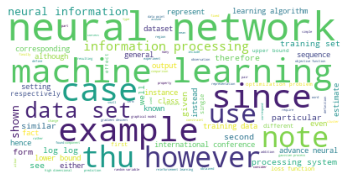

In [ ]:
#Word cloud
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
import matplotlib.pyplot as plt

wordcloud = WordCloud(background_color='white',
                      stopwords=stop_words,
                      max_words=100,
                      max_font_size=50, 
                      random_state=42).generate(str(final_corpus))
                      
print(wordcloud)
fig = plt.figure(1)
plt.imshow(wordcloud)
plt.axis('off')
plt.show()
fig.savefig("word1.png", dpi=900)

In [ ]:
import pickle
from sklearn.feature_extraction.text import CountVectorizer

cv=CountVectorizer(max_df=0.8,stop_words=stop_words, max_features=50000, ngram_range=(1,3))
pickle.dump(cv, open('transformer.pkl', 'wb')) ## saving to into transformer.pkl file

X=cv.fit_transform(corpus).toarray()

words = cv.get_feature_names()
pickle.dump(words,open('vocabulary.pkl','wb')) ## saving to into vocabulary.pkl file

In [ ]:
list(cv.vocabulary_.keys())[:10]

['self',
 'organization',
 'associative',
 'database',
 'application',
 'pdf',
 'suzuki',
 'japan',
 'efficient',
 'organizing']

[Text(0, 0, 'model'),
 Text(0, 0, 'algorithm'),
 Text(0, 0, 'learning'),
 Text(0, 0, 'function'),
 Text(0, 0, 'data'),
 Text(0, 0, 'set'),
 Text(0, 0, 'network'),
 Text(0, 0, 'method'),
 Text(0, 0, 'problem'),
 Text(0, 0, 'time'),
 Text(0, 0, 'distribution'),
 Text(0, 0, 'number'),
 Text(0, 0, 'matrix'),
 Text(0, 0, 'value'),
 Text(0, 0, 'parameter'),
 Text(0, 0, 'feature'),
 Text(0, 0, 'training'),
 Text(0, 0, 'state'),
 Text(0, 0, 'result'),
 Text(0, 0, 'neural')]

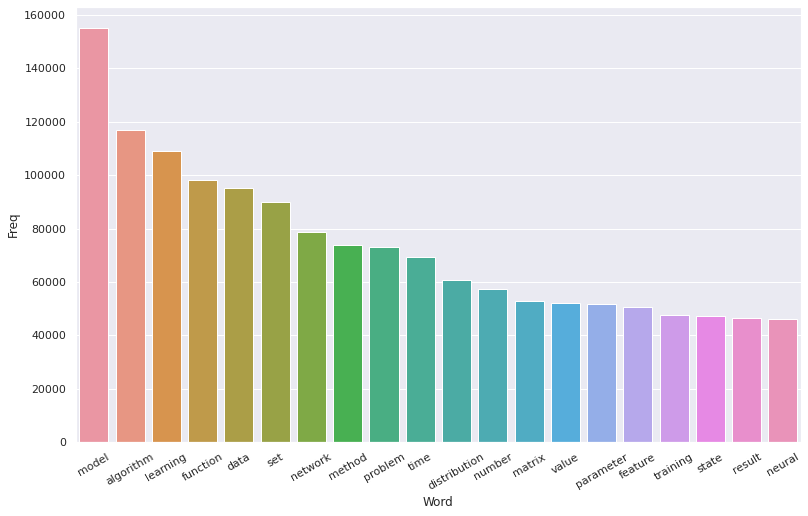

In [ ]:
#Most frequently occuring words
def get_top_n_words(corpus, n=None):
    vec = CountVectorizer(ngram_range=(1,1)).fit(corpus)
    bag_of_words = vec.transform(corpus)
    sum_words = bag_of_words.sum(axis=0) 
    words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]
    words_freq =sorted(words_freq, key = lambda x: x[1], reverse=True)
    return words_freq[:n]

#Convert most freq words to dataframe for plotting bar plot
top_words = get_top_n_words(final_corpus, n=20)
top_df = pd.DataFrame(top_words)
top_df.columns=["Word", "Freq"]
print(top_df)

#Barplot of most freq words
import seaborn as sns
sns.set(rc={'figure.figsize':(13,8)})
g = sns.barplot(x="Word", y="Freq", data=top_df)
g.set_xticklabels(g.get_xticklabels(), rotation=90)

                     Bi-gram   Freq
0             neural network  20908
1           machine learning  15822
2                   data set   9620
3     information processing   9596
4         neural information   9105
5          processing system   9047
6                    log log   8090
7               training set   7670
8         learning algorithm   7331
9                lower bound   7136
10  international conference   6900
11            advance neural   6817
12             training data   5883
13             loss function   5762
14      optimization problem   5610
15               upper bound   5561
16    reinforcement learning   5455
17                data point   5450
18           random variable   5220
19           graphical model   5139


[Text(0, 0, 'neural network'),
 Text(0, 0, 'machine learning'),
 Text(0, 0, 'data set'),
 Text(0, 0, 'information processing'),
 Text(0, 0, 'neural information'),
 Text(0, 0, 'processing system'),
 Text(0, 0, 'log log'),
 Text(0, 0, 'training set'),
 Text(0, 0, 'learning algorithm'),
 Text(0, 0, 'lower bound'),
 Text(0, 0, 'international conference'),
 Text(0, 0, 'advance neural'),
 Text(0, 0, 'training data'),
 Text(0, 0, 'loss function'),
 Text(0, 0, 'optimization problem'),
 Text(0, 0, 'upper bound'),
 Text(0, 0, 'reinforcement learning'),
 Text(0, 0, 'data point'),
 Text(0, 0, 'random variable'),
 Text(0, 0, 'graphical model')]

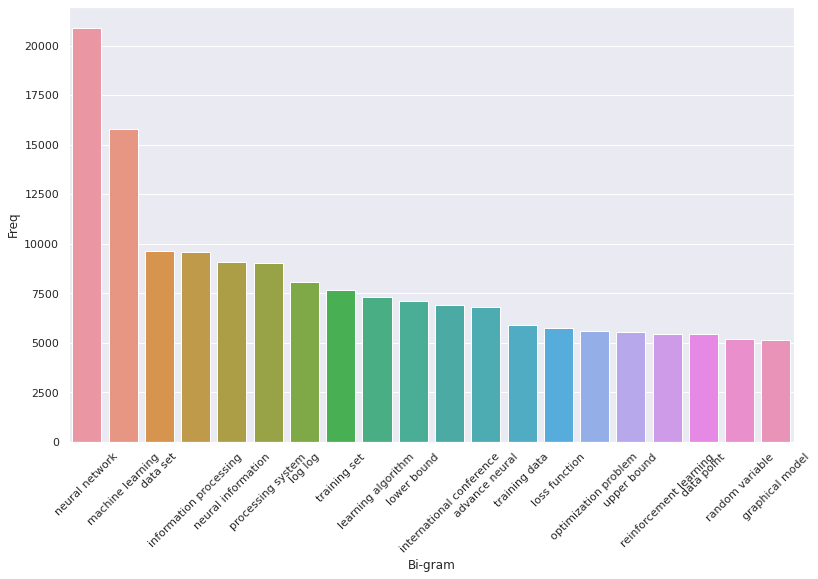

In [ ]:
#Most frequently occuring Bi-grams
def get_top_n2_words(corpus, n=None):
    vec1 = CountVectorizer(ngram_range=(2,2)).fit(corpus)
    bag_of_words = vec1.transform(corpus)
    sum_words = bag_of_words.sum(axis=0) 
    words_freq = [(word, sum_words[0, idx]) for word, idx in vec1.vocabulary_.items()]
    words_freq =sorted(words_freq, key = lambda x: x[1], reverse=True)
    return words_freq[:n]

top2_words = get_top_n2_words(final_corpus, n=20)
top2_df = pd.DataFrame(top2_words)
top2_df.columns=["Bi-gram", "Freq"]
print(top2_df)

#Barplot of most freq Bi-grams
import seaborn as sns
sns.set(rc={'figure.figsize':(13,8)})
h=sns.barplot(x="Bi-gram", y="Freq", data=top2_df)
h.set_xticklabels(h.get_xticklabels(), rotation=90)

                               Tri-gram  Freq
0         neural information processing  9003
1         information processing system  8852
2            advance neural information  6688
3                  arxiv preprint arxiv  3621
4           conference machine learning  3544
5      international conference machine  3368
6             machine learning research  3220
7              journal machine learning  3077
8                           log log log  2649
9                processing system page  2646
10  proceeding international conference  2602
11                processing system nip  2441
12               support vector machine  2439
13             recurrent neural network  1581
14                  hidden markov model  1567
15          department computer science  1535
16             semi supervised learning  1497
17        conference neural information  1452
18          stochastic gradient descent  1405
19         convolutional neural network  1373


[Text(0, 0, 'neural information processing'),
 Text(0, 0, 'information processing system'),
 Text(0, 0, 'advance neural information'),
 Text(0, 0, 'arxiv preprint arxiv'),
 Text(0, 0, 'conference machine learning'),
 Text(0, 0, 'international conference machine'),
 Text(0, 0, 'machine learning research'),
 Text(0, 0, 'journal machine learning'),
 Text(0, 0, 'log log log'),
 Text(0, 0, 'processing system page'),
 Text(0, 0, 'proceeding international conference'),
 Text(0, 0, 'processing system nip'),
 Text(0, 0, 'support vector machine'),
 Text(0, 0, 'recurrent neural network'),
 Text(0, 0, 'hidden markov model'),
 Text(0, 0, 'department computer science'),
 Text(0, 0, 'semi supervised learning'),
 Text(0, 0, 'conference neural information'),
 Text(0, 0, 'stochastic gradient descent'),
 Text(0, 0, 'convolutional neural network')]

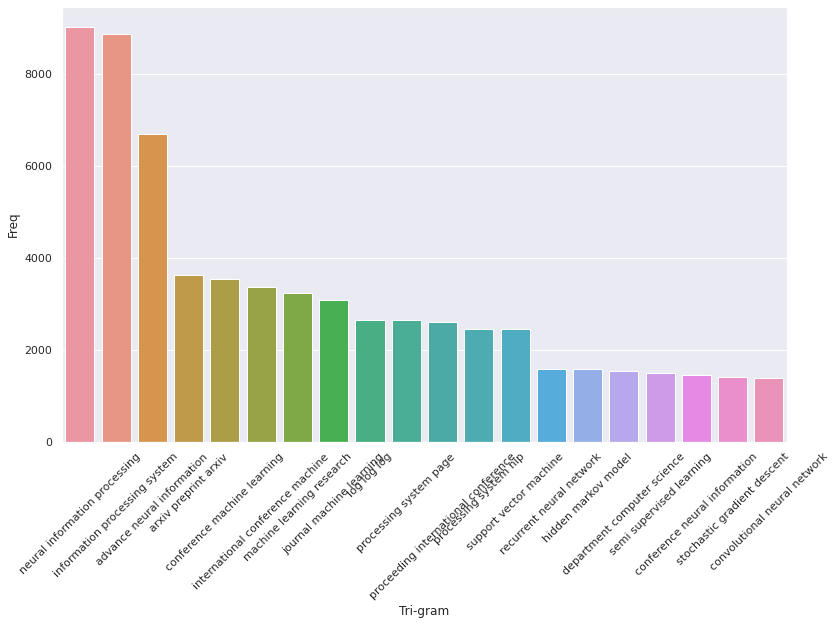

In [ ]:
#Most frequently occuring Tri-grams
def get_top_n3_words(corpus, n=None):
    vec2 = CountVectorizer(ngram_range=(3,3)).fit(corpus)
    bag_of_words = vec2.transform(corpus)
    sum_words = bag_of_words.sum(axis=0) 
    words_freq = [(word, sum_words[0, idx]) for word, idx in vec2.vocabulary_.items()]
    words_freq =sorted(words_freq, key = lambda x: x[1], reverse=True)
    return words_freq[:n]

top3_words = get_top_n3_words(final_corpus, n=20)
top3_df = pd.DataFrame(top3_words)
top3_df.columns=["Tri-gram", "Freq"]
print(top3_df)

#Barplot of most freq Tri-grams
import seaborn as sns
sns.set(rc={'figure.figsize':(13,8)})
j=sns.barplot(x="Tri-gram", y="Freq", data=top3_df)
j.set_xticklabels(j.get_xticklabels(), rotation=90)